In [4]:
import os
import sys
sys.path.append('../.')
from utils.utils import save_image_grid_with_labels, get_concept_index
import argparse
import numpy as np
from pathlib import Path
import yaml
import torch
from ast import literal_eval
from torch.autograd import Variable
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
from torch import nn
from models import cbae_stygan2
from torchvision import transforms, models
from utils import gan_loss
import itertools
import warnings
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
from eval.eval_intervention_gan import opt_int
import time

### Setup

* The next code block sets up the hyperparameters for the visualization.
* Use `optint=True` to use optimization-based interventions and `optint=False` for CB-AE interventions.
* Select target concept from:
    - Smiling
    - Mouth_Slightly_Open
    - Male
    - Arched_Eyebrows
    - Heavy_Makeup
    - High_Cheekbones
    - Wearing_Lipstick
    - Attractive
* Use `concept_value=1` for intervention target to be target concept (e.g. Smiling) and `concept_value=0` for opposite of target concept (e.g. Not Smiling).

In [5]:
# dataset to evaluate on
dataset = 'celebahq'
# experiment name
expt_name = 'cbae_stygan2_thr90'
# tensorboard name
tensorboard_name = 'sup_pl_unk40_cls8'
# whether to use optimization-based interventions
optint = True
optint_eps = 0.1
optint_iters = 50

# target concept and target value (desired concept to intervene on), e.g. "Smiling", "Mouth_Slightly_Open", "Male"
target_concept = 'Mouth_Slightly_Open'
## e.g. 0 or 1 (since all concepts in CelebA-HQ are binary)
concept_value = 0

clsf_model_type = 'rn18'
device = 'cuda:0'

### Load generative model with CB-AE

In [6]:
config_file = f"../config/{expt_name}/"+dataset+".yaml"

with open(config_file, 'r') as stream:
    config = yaml.safe_load(stream)
print(f"Loaded configuration file {config_file}")

Loaded configuration file ../config/cbae_stygan2_thr90/celebahq.yaml


In [7]:
num_cls = 8
set_of_classes = [
    ['NOT Attractive', 'Attractive'],
    ['NO Lipstick', 'Wearing Lipstick'],
    ['Mouth Closed', 'Mouth Slightly Open'],
    ['NOT Smiling', 'Smiling'],
    ['Low Cheekbones', 'High Cheekbones'],
    ['NO Makeup', 'Heavy Makeup'],
    ['Female', 'Male'],
    ['Straight Eyebrows', 'Arched Eyebrows']
]
conc_clsf_classes = [
    'Attractive',
    'Wearing_Lipstick',
    'Mouth_Slightly_Open',
    'Smiling',
    'High_Cheekbones',
    'Heavy_Makeup',
    'Male',
    'Arched_Eyebrows',
]

concept_change = conc_clsf_classes.index(target_concept)
config['model']['pretrained'] = '../models/checkpoints/stylegan2-celebahq-256x256.pkl'
model = cbae_stygan2.cbAE_StyGAN2(config)

cbae_ckpt_path = f'../models/checkpoints/{dataset}_{expt_name}_{tensorboard_name}_cbae.pt'

model.cbae.load_state_dict(torch.load(cbae_ckpt_path, map_location='cpu'))
model.to(device)
model.eval();

loading stylegan2 from ../models/checkpoints/stylegan2-celebahq-256x256.pkl
Total concepts (including unknown): 56
number of layers in CB-AE: 20


### Load concept classifier to evaluate concept interventions

In [8]:
if clsf_model_type == 'rn18':
    con_clsf = models.resnet18(weights='DEFAULT')
    num_features = con_clsf.fc.in_features
    con_clsf.fc = nn.Linear(num_features, 2) # binary classification (num_of_class == 2)
elif clsf_model_type == 'rn50':
    con_clsf = models.resnet50(weights='DEFAULT')
    num_features = con_clsf.fc.in_features
    con_clsf.fc = nn.Linear(num_features, 2) # binary classification (num_of_class == 2)
elif clsf_model_type == 'vit_l_16':
    con_clsf = models.vit_l_16(weights='ViT_L_16_Weights.IMAGENET1K_SWAG_E2E_V1')
    num_features = con_clsf.heads.head.in_features
    con_clsf.heads = nn.Linear(num_features, 2)

con_clsf.load_state_dict(torch.load(f'../models/checkpoints/{dataset}_{target_concept}_{clsf_model_type}_conclsf.pth', map_location='cpu'))
print(f'loading concept classifier from models/checkpoints/{dataset}_{target_concept}_{clsf_model_type}_conclsf.pth')
con_clsf = con_clsf.to(device)
con_clsf.eval()

tf_conclsf = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
if clsf_model_type == 'vit_l_16':
    ### generated by chatgpt
    class ResizeNormalizeTransform:
        def __init__(self, resize_size=(512, 512), mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
            self.resize_size = resize_size
            self.normalize = transforms.Normalize(mean, std)

        def __call__(self, img_tensor):
            # Resize the tensor using interpolate (for BxCxHxW input)
            img_tensor = F.interpolate(img_tensor, size=self.resize_size, mode='bilinear', align_corners=False)
            # Normalize the tensor
            return self.normalize(img_tensor)

    tf_conclsf = ResizeNormalizeTransform()

loading concept classifier from models/checkpoints/celebahq_Mouth_Slightly_Open_rn18_conclsf.pth


### Perform concept interventions

In [9]:
batch_size = 16
num_steps = 20

orig_images_list = []
interv_images_list = []
for idx in tqdm(range(num_steps)):
    # intervene on one selected concept with selected value
    concept_change = concept_change
    concept_value = concept_value

    # Sample noise and labels as generator input
    z = torch.randn((batch_size, model.gen.z_dim), device=device)
    latent = model.gen.mapping(z, None, truncation_psi=1.0, truncation_cutoff=None)

    if optint:
        recon_latent = latent.detach().clone()
        new_latent = opt_int(model, latent, concept_change, concept_value, num_iters=optint_iters, eps=optint_eps, device=device)

    concepts = model.cbae.enc(latent)

    new_concepts = concepts.clone()

    start, end = get_concept_index(model, concept_change)
    c_concepts = concepts[:, start:end]
    _, num_c = c_concepts.shape

    # swapping the max value to the concept we need
    new_c_concepts = c_concepts.clone()
    old_vals = new_c_concepts[:, concept_value].clone()
    max_val, max_ind = torch.max(new_c_concepts, dim=1)
    new_c_concepts[:, concept_value] = max_val
    for swap_idx, (curr_ind, curr_old_val) in enumerate(zip(max_ind, old_vals)):
        new_c_concepts[swap_idx, curr_ind] = curr_old_val

    new_concepts[:, start:end] = new_c_concepts

    if not optint:
        new_latent = model.cbae.dec(new_concepts)
    recon_latent = model.cbae.dec(concepts)

    # Generate a batch of images
    gen_imgs_latent = model.gen.synthesis(new_latent, noise_mode='const')
    gen_imgs_latent_orig = model.gen.synthesis(recon_latent, noise_mode='const')

    gen_imgs_latent = gen_imgs_latent.mul(0.5).add_(0.5)
    gen_imgs_latent_orig = gen_imgs_latent_orig.mul(0.5).add_(0.5)

    # converting it to the normalization required by ResNet18 concept classifier
    gen_imgs_latent_cc = tf_conclsf(gen_imgs_latent)
    gen_imgs_latent_orig_cc = tf_conclsf(gen_imgs_latent_orig)

    interv_pred = con_clsf(gen_imgs_latent_cc).argmax(dim=1)
    recon_pred = con_clsf(gen_imgs_latent_orig_cc).argmax(dim=1)

    # pick out samples which do not have the desired concept value (to see change with intervention)
    curr_mask = (recon_pred != concept_value)
    if gen_imgs_latent.data[curr_mask].numel() != 0:
        orig_imgs = save_image_grid_with_labels(gen_imgs_latent_orig.data[curr_mask], recon_pred[curr_mask], set_of_classes[concept_change], grid_size=(4, 4), file_name=None, return_images=True).detach().cpu()
        interv_imgs = save_image_grid_with_labels(gen_imgs_latent.data[curr_mask], interv_pred[curr_mask], set_of_classes[concept_change], grid_size=(4, 4), file_name=None, return_images=True).detach().cpu()
        orig_images_list.append(orig_imgs)
        interv_images_list.append(interv_imgs)

orig_images = torch.cat(orig_images_list, dim=0)
interv_images = torch.cat(interv_images_list, dim=0)

orig_grid = make_grid(orig_images[:64], nrow=8, padding=2, normalize=True)
interv_grid = make_grid(interv_images[:64], nrow=8, padding=2, normalize=True)

  0%|                                                                              | 0/20 [00:00<?, ?it/s]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


100%|█████████████████████████████████████████████████████████████████████| 20/20 [00:07<00:00,  2.54it/s]


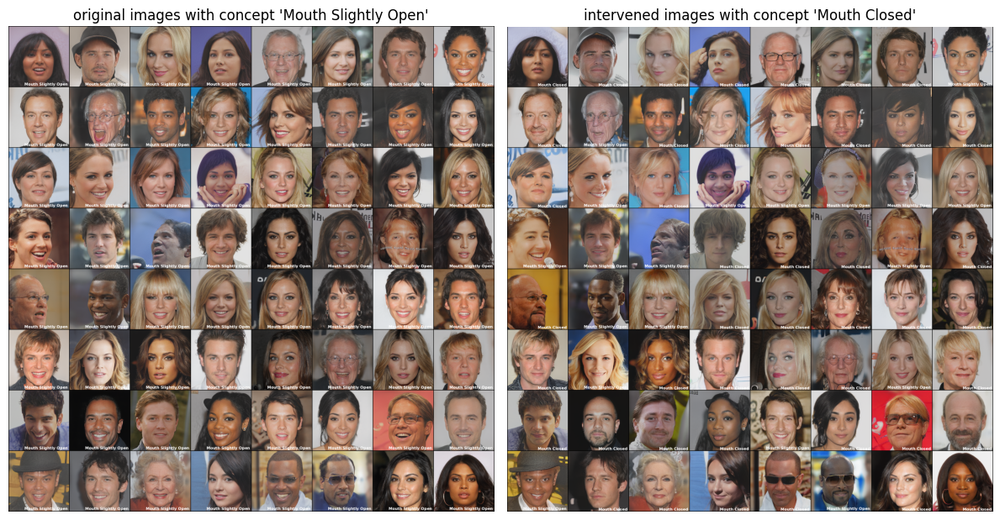

In [10]:
def imshow_grid(grid, title, ax):
    # Convert from torch tensor to numpy image
    npimg = grid.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
    ax.imshow(npimg)
    ax.set_title(title)
    ax.axis('off')

fig, axs = plt.subplots(1, 2, figsize=(12, 12))

imshow_grid(orig_grid, f"original images with concept \'{set_of_classes[concept_change][1 - concept_value]}\'", axs[0])
imshow_grid(interv_grid, f"intervened images with concept \'{set_of_classes[concept_change][concept_value]}\'", axs[1])

plt.tight_layout()
plt.show()

## Single-Image Concept Intervention Example (Smiling Attribute)

In this section, we demonstrate a targeted intervention on a single synthesized image to explicitly manipulate the "Smiling" attribute using the model's concept bottleneck. This approach allows us to observe the effect of changing a specific semantic concept while keeping all other factors constant.

**Procedure:**
1. **Sample Generation:**
   Generate a random latent vector and synthesize a baseline image using the generator.
2. **No-Intervention Reconstruction:**
   Reconstruct the image with no intervention (all concept values preserved), establishing the original baseline.
3. **Intervention:**
   Modify the "Smiling" concept value in the bottleneck, setting it to the desired target state (e.g., force a smile on a non-smiling face).
4. **Synthesis and Visualization:**
   Decode the edited concept vector back to latent space and generate the intervened image. Display the original and intervened images side by side for visual comparison.

This single-sample intervention illustrates the direct and interpretable nature of concept bottleneck manipulations. It also highlights the ability to perform fine-grained, attribute-specific edits while minimizing changes to unrelated facial features.

---

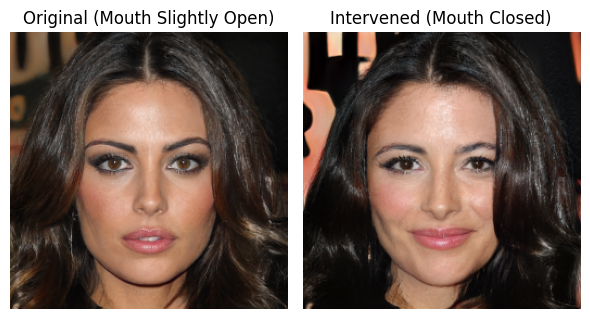

In [11]:
import random
import matplotlib.pyplot as plt

def visualize_single_intervention(model, con_clsf, target_concept, concept_value, device='cuda:0'):
    """
    Samples one latent z, runs both recon (no intervention) and an intervention
    on the specified concept, and plots them side by side.
    """
    # 1) Sample a single latent
    z = torch.randn((1, model.gen.z_dim), device=device)
    latent = model.gen.mapping(z, None, truncation_psi=1.0, truncation_cutoff=None)

    # 2) Recon (no intervention)
    recon_latent = model.cbae.dec(model.cbae.enc(latent))
    orig_img = model.gen.synthesis(recon_latent, noise_mode='const').clamp(-1, 1).mul(0.5).add_(0.5)

    # 3) Optimization‐based intervention (optint must be set True earlier)
    new_latent = opt_int(model, latent,
                        conc_clsf_classes.index(target_concept),
                        concept_value,
                        num_iters=optint_iters,
                        eps=optint_eps,
                        device=device)
    intv_img = model.gen.synthesis(new_latent, noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)

    # 4) Convert to CPU & normalize for the classifier
    to_display = torch.cat([orig_img, intv_img], dim=0).cpu()

    # 5) Plot
    fig, axes = plt.subplots(1, 2, figsize=(6, 6))
    titles = [
        f"Original ({set_of_classes[concept_change][1 - concept_value]})",
        f"Intervened ({set_of_classes[concept_change][concept_value]})"
    ]
    for ax, img, t in zip(axes, to_display, titles):
        # detach before squeezing & permuting
        npimg = img.detach().cpu().squeeze().permute(1, 2, 0).numpy()
        ax.imshow(npimg)
        ax.set_title(t)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Example call:
visualize_single_intervention(model, con_clsf, target_concept, concept_value, device)

### Example #2: Gender Swap Intervention

In this example, we apply both concept-bottleneck and optimization-based interventions to a synthesized face to manipulate the "Male" attribute. The procedure demonstrates how a model responds to controlled edits of gender representation in the latent space.

**Procedure:**
1. **Sample Selection:**
   A random latent code is sampled and used to generate an initial face classified as "Male" with high confidence by the concept classifier.
2. **CB-AE Bottleneck Swap:**
   The "Male" concept slice in the CB-AE bottleneck is directly modified to target "Female." The resulting image is synthesized to reflect the attribute change.
3. **PGD Intervention:**
   Using Projected Gradient Descent (PGD), the latent code is iteratively perturbed to minimize the classifier's confidence in the "Male" label and maximize confidence in "Female," subject to a norm constraint.
   - Both an intermediate (50% of steps) and a full (100% of steps) PGD result are visualized.
4. **Visualization:**
   All stages—original, CB-AE swap, PGD 50%, and PGD 100%—are displayed side by side to facilitate comparison of the effectiveness and qualitative differences between interventions.

This example provides insight into the ability of both direct and optimization-based methods to control high-level semantic attributes, and highlights the robustness or limitations of the generative model and classifier in response to attribute editing.

---Example #2 Gennder swap  intervenion.



=== Sample 1 ===
Original is Male 🔒 logits=[-3.9558472633361816, 5.053893089294434], probs=[0.00012219860218465328, 0.9998778104782104]
After CB-AE swap → logits=[-3.9699065685272217, 5.041733741760254], probs=[0.00012196670286357403, 0.9998780488967896]
After PGD 50% → logits=[-3.4302871227264404, 4.79901647567749], probs=[0.0002666509535629302, 0.9997333884239197]
After PGD 100% → logits=[-3.5287859439849854, 4.707822322845459], probs=[0.0002647106593940407, 0.9997352957725525]


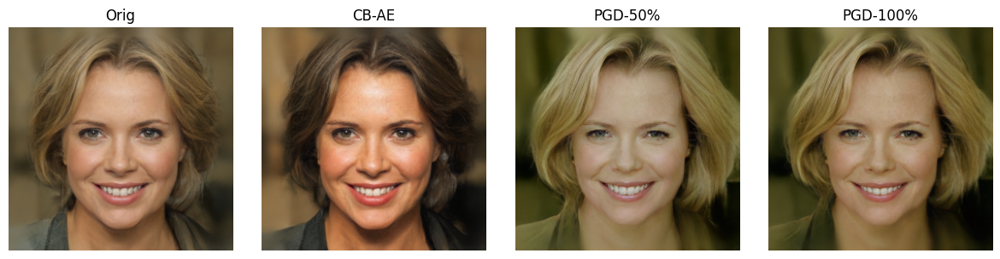


=== Sample 2 ===
Original is Male 🔒 logits=[-4.080911636352539, 5.200534820556641], probs=[9.312763722846285e-05, 0.9999068975448608]
After CB-AE swap → logits=[-3.4339351654052734, 4.414851665496826], probs=[0.00039007290615700185, 0.9996100068092346]
After PGD 50% → logits=[1.309794545173645, -0.5118169784545898], probs=[0.8607593774795532, 0.13924062252044678]
After PGD 100% → logits=[-2.726726770401001, 3.978536605834961], probs=[0.001222953200340271, 0.9987770915031433]


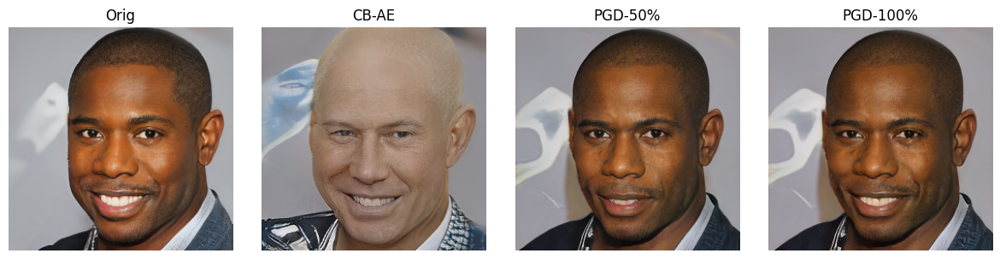


=== Sample 3 ===
Original is Male 🔒 logits=[-4.224128723144531, 4.9383649826049805], probs=[0.00010488997213542461, 0.9998950958251953]
After CB-AE swap → logits=[-5.8184614181518555, 7.206996917724609], probs=[2.2035067104297923e-06, 0.9999978542327881]
After PGD 50% → logits=[-3.543064594268799, 4.619013786315918], probs=[0.0002851873869076371, 0.9997147917747498]
After PGD 100% → logits=[-3.1752822399139404, 4.2872090339660645], probs=[0.0005738944164477289, 0.9994261264801025]


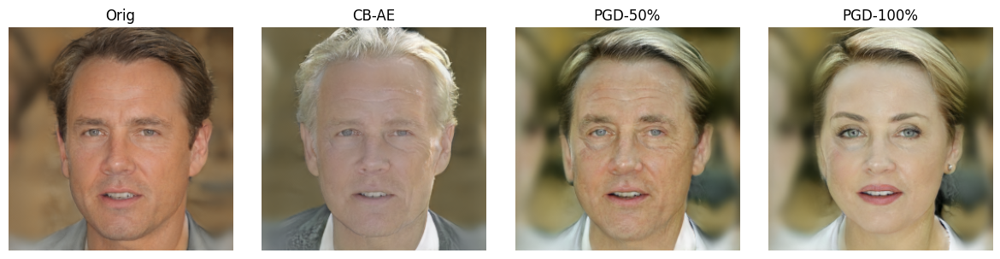

In [12]:
# %% code
import torch
import matplotlib.pyplot as plt
from torch.nn.functional import softmax, one_hot
from utils.utils import get_concept_index

# Identify the gender slice
gender_idx = conc_clsf_classes.index('Male')
start, end = get_concept_index(model, gender_idx)
slice_size = end - start  # should be 2

# Classifier helper that returns (logits, probs)
def get_gender_scores(img):
    """
    img: [C,H,W] in [0,1]
    returns: logits (2,), probs (2,) for [Female, Male]
    """
    x      = tf_conclsf(img.unsqueeze(0))  # [1,C,H,W]
    logits = con_clsf(x)[0]                 # [2]
    probs  = softmax(logits, dim=0)         # [2]
    return logits.detach().cpu().tolist(), probs.detach().cpu().tolist()

# PGD params
full_steps = optint_iters
half_steps = full_steps // 2
eps        = optint_eps

for sample_i in range(1, 4):
    print(f"\n=== Sample {sample_i} ===")
    # 1) Sample a high-confidence male
    for _ in range(100):
        z      = torch.randn((1, model.gen.z_dim), device=device)
        w      = model.gen.mapping(z, None, truncation_psi=1.0)
        img_o  = model.gen.synthesis(model.cbae.dec(model.cbae.enc(w)),
                                     noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)[0]
        logits_o, probs_o = get_gender_scores(img_o)
        if probs_o[1] > 0.9:  # index 1 = Male
            print("Original is Male 🔒",
                  f"logits={logits_o}, probs={probs_o}")
            break
    else:
        raise RuntimeError("Could not find a confident Male")

    # 2) CB-AE bottleneck swap to Female
    c_orig = model.cbae.enc(w)
    c_fem  = c_orig.clone()
    c_fem[:, start:end] = 0
    # one-hot to Female (index 0)
    c_fem[:, start:end] = one_hot(torch.tensor([0], device=device), num_classes=slice_size).float()
    img_b   = model.gen.synthesis(model.cbae.dec(c_fem),
                                   noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)[0]
    logits_b, probs_b = get_gender_scores(img_b)
    print("After CB-AE swap →",
          f"logits={logits_b}, probs={probs_b}")

    # 3) Half‐step PGD
    w_half = opt_int(model, w, gender_idx, 0,
                     num_iters=half_steps, eps=eps, device=device)
    img_h   = model.gen.synthesis(w_half,
                                   noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)[0]
    logits_h, probs_h = get_gender_scores(img_h)
    print("After PGD 50% →",
          f"logits={logits_h}, probs={probs_h}")

    # 4) Full‐step PGD
    w_full = opt_int(model, w, gender_idx, 0,
                     num_iters=full_steps, eps=eps, device=device)
    img_f   = model.gen.synthesis(w_full,
                                   noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)[0]
    logits_f, probs_f = get_gender_scores(img_f)
    print("After PGD 100% →",
          f"logits={logits_f}, probs={probs_f}")

    # 5) Quick visualization
    fig, axes = plt.subplots(1, 4, figsize=(12,3))
    for ax, im, stage in zip(axes, [img_o, img_b, img_h, img_f],
                             ['Orig', 'CB-AE', 'PGD-50%', 'PGD-100%']):
        ax.imshow(im.detach().cpu().permute(1,2,0).numpy())
        ax.set_title(stage)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

Intervention Example 3

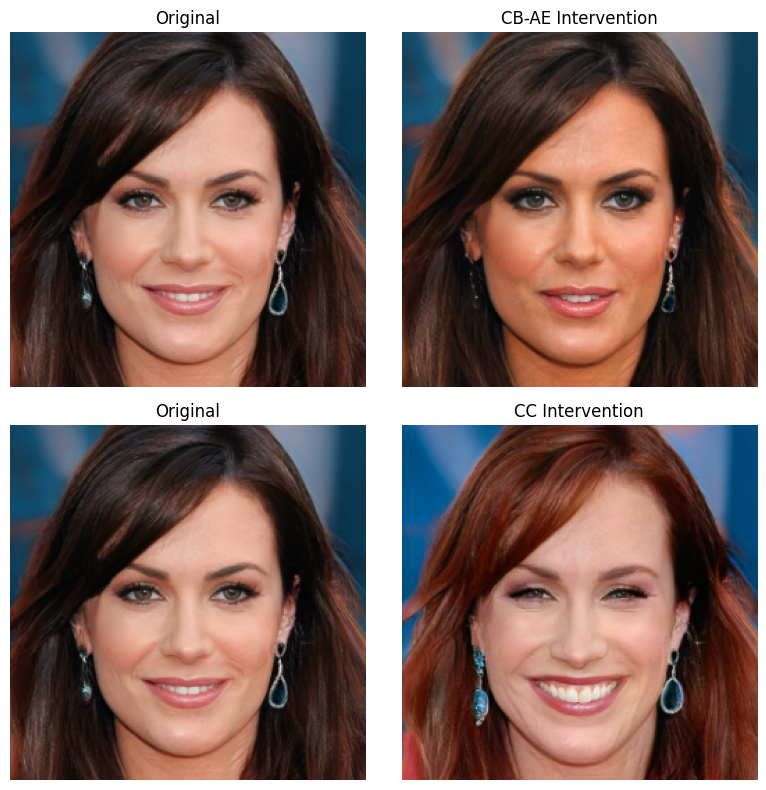

In [17]:
import torch
import matplotlib.pyplot as plt
from torch.nn.functional import one_hot
from utils.utils import get_concept_index

# Identify the “Smiling” slice in the concept bottleneck
smile_idx = conc_clsf_classes.index('Smiling')
start, end = get_concept_index(model, smile_idx)
slice_size = end - start  # expected = 2

# Sample a single latent vector and synthesize the “before” image
z = torch.randn((1, model.gen.z_dim), device=device)
w = model.gen.mapping(z, None, truncation_psi=1.0)
# Encode→decode (no intervention) to reconstruct at baseline
c_orig = model.cbae.enc(w)
w_orig = model.cbae.dec(c_orig)
img_orig = model.gen.synthesis(w_orig, noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CB-AE Intervention (force “Smiling”) =====
c_swap = c_orig.clone()
c_swap[:, start:end] = 0
# Set “Smiling” = on (index 1)
c_swap[:, start:end] = one_hot(torch.tensor([1], device=device), num_classes=slice_size).float()
w_cbae = model.cbae.dec(c_swap)
img_cbae = model.gen.synthesis(w_cbae, noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CC (Optimization-Based) Intervention (force “Smiling”) =====
w_cc = opt_int(model, w, smile_idx, 1, num_iters=optint_iters, eps=optint_eps, device=device)
img_cc = model.gen.synthesis(w_cc, noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== Plot Before/After Pairs =====
fig, axes = plt.subplots(2, 2, figsize=(8, 8))

# Row 1: Original vs CB-AE result
axes[0, 0].imshow(img_orig.detach().cpu().permute(1, 2, 0).numpy())
axes[0, 0].set_title('Original')
axes[0, 0].axis('off')

axes[0, 1].imshow(img_cbae.detach().cpu().permute(1, 2, 0).numpy())
axes[0, 1].set_title('CB-AE Intervention')
axes[0, 1].axis('off')

# Row 2: Original vs CC result
axes[1, 0].imshow(img_orig.detach().cpu().permute(1, 2, 0).numpy())
axes[1, 0].set_title('Original')
axes[1, 0].axis('off')

axes[1, 1].imshow(img_cc.detach().cpu().permute(1, 2, 0).numpy())
axes[1, 1].set_title('CC Intervention')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

Gender Swap for CB-AE and CC

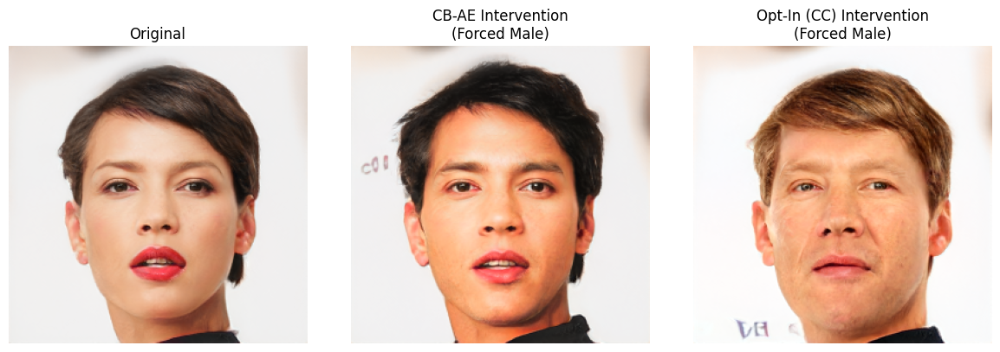

In [23]:
import torch
import matplotlib.pyplot as plt
from torch.nn.functional import one_hot
from utils.utils import get_concept_index

# Identify the “Male” slice in the concept bottleneck
gender_idx = conc_clsf_classes.index('Male')
start, end = get_concept_index(model, gender_idx)
slice_size = end - start  # should equal 2

# Sample a single latent vector and synthesize the “before” image
z = torch.randn((1, model.gen.z_dim), device=device)
w = model.gen.mapping(z, None, truncation_psi=1.0)

# Encode→decode (no intervention) to reconstruct baseline
c_orig = model.cbae.enc(w)
w_orig = model.cbae.dec(c_orig)
img_orig = model.gen.synthesis(w_orig, noise_mode='const')\
                 .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CB-AE Intervention (force “Male”) =====
c_swap = c_orig.clone()
c_swap[:, start:end] = 0
# Set “Male” = index 1 in the gender slice
c_swap[:, start:end] = one_hot(torch.tensor([1], device=device), num_classes=slice_size).float()
w_cbae = model.cbae.dec(c_swap)
img_cbae = model.gen.synthesis(w_cbae, noise_mode='const')\
                    .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CC (Optimization-Based) Intervention (force “Male”) =====
w_cc = opt_int(model, w, gender_idx, 1, num_iters=optint_iters, eps=optint_eps, device=device)
img_cc = model.gen.synthesis(w_cc, noise_mode='const')\
                  .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== Plot Original, CB-AE, and Opt-In (CC) Side by Side =====
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Original image
axes[0].imshow(img_orig.detach().cpu().permute(1, 2, 0).numpy())
axes[0].set_title('Original')
axes[0].axis('off')

# CB-AE intervention result
axes[1].imshow(img_cbae.detach().cpu().permute(1, 2, 0).numpy())
axes[1].set_title('CB-AE Intervention\n(Forced Male)')
axes[1].axis('off')

# Optimization-based (opt-in) intervention result
axes[2].imshow(img_cc.detach().cpu().permute(1, 2, 0).numpy())
axes[2].set_title('Opt-In (CC) Intervention\n(Forced Male)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

Lipstick apply with opt-in for CC

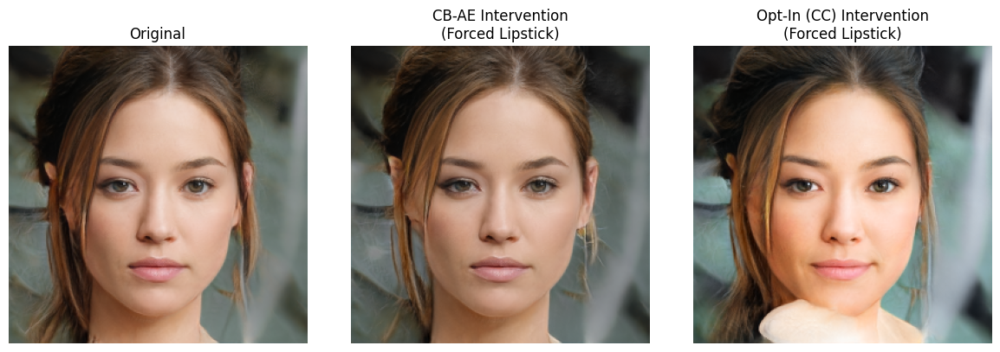

In [24]:
import torch
import matplotlib.pyplot as plt
from torch.nn.functional import one_hot
from utils.utils import get_concept_index

# Identify the “Wearing_Lipstick” slice in the concept bottleneck
lipstick_idx = conc_clsf_classes.index('Wearing_Lipstick')
start, end = get_concept_index(model, lipstick_idx)
slice_size = end - start  # should equal 2

# Sample a single latent vector and synthesize the “before” image
z = torch.randn((1, model.gen.z_dim), device=device)
w = model.gen.mapping(z, None, truncation_psi=1.0)

# Encode→decode (no intervention) to reconstruct baseline
c_orig = model.cbae.enc(w)
w_orig = model.cbae.dec(c_orig)
img_orig = model.gen.synthesis(w_orig, noise_mode='const')\
                 .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CB-AE Intervention (force “Wearing_Lipstick”) =====
c_swap = c_orig.clone()
c_swap[:, start:end] = 0
# Set “Wearing_Lipstick” = index 1 in the lipstick slice
c_swap[:, start:end] = one_hot(torch.tensor([1], device=device), num_classes=slice_size).float()
w_cbae = model.cbae.dec(c_swap)
img_cbae = model.gen.synthesis(w_cbae, noise_mode='const')\
                    .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CC (Optimization-Based / opt-in) Intervention (force “Wearing_Lipstick”) =====
w_cc = opt_int(model, w, lipstick_idx, 1, num_iters=optint_iters, eps=optint_eps, device=device)
img_cc = model.gen.synthesis(w_cc, noise_mode='const')\
                  .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== Plot Original, CB-AE, and CC Side by Side =====
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Original image
axes[0].imshow(img_orig.detach().cpu().permute(1, 2, 0).numpy())
axes[0].set_title('Original')
axes[0].axis('off')

# CB-AE intervention result
axes[1].imshow(img_cbae.detach().cpu().permute(1, 2, 0).numpy())
axes[1].set_title('CB-AE Intervention\n(Forced Lipstick)')
axes[1].axis('off')

# Optimization-based (opt-in) intervention result
axes[2].imshow(img_cc.detach().cpu().permute(1, 2, 0).numpy())
axes[2].set_title('Opt-In (CC) Intervention\n(Forced Lipstick)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

Attractive Intervention

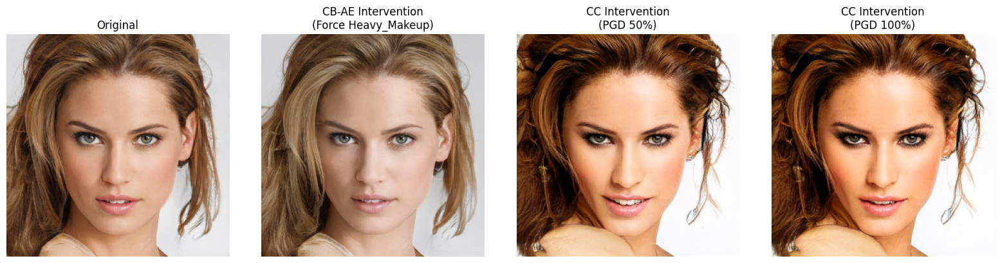

In [34]:
import torch
import matplotlib.pyplot as plt
from torch.nn.functional import one_hot
from utils.utils import get_concept_index

# Identify the “Heavy_Makeup” slice in the concept bottleneck
makeup_idx = conc_clsf_classes.index('Heavy_Makeup')
start, end = get_concept_index(model, makeup_idx)
slice_size = end - start  # should equal 2 for a binary attribute

# PGD (opt-in) parameters
full_steps = optint_iters
half_steps = full_steps // 2
eps        = optint_eps

# Sample a single latent vector and synthesize the “before” image
z = torch.randn((1, model.gen.z_dim), device=device)
w = model.gen.mapping(z, None, truncation_psi=1.0)

# Encode → decode (no intervention) to reconstruct baseline
c_orig = model.cbae.enc(w)
w_orig = model.cbae.dec(c_orig)
img_orig = model.gen.synthesis(w_orig, noise_mode='const')\
                 .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CB-AE Intervention (force “Heavy_Makeup” = on) =====
c_swap = c_orig.clone()
c_swap[:, start:end] = 0
# Set “Heavy_Makeup” = index 1 (on)
c_swap[:, start:end] = one_hot(torch.tensor([1], device=device), num_classes=slice_size).float()
w_cbae = model.cbae.dec(c_swap)
img_cbae = model.gen.synthesis(w_cbae, noise_mode='const')\
                    .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CC (PGD 50%: half‐step) =====
w_half = opt_int(model, w, makeup_idx, 1,
                 num_iters=half_steps, eps=eps, device=device)
img_cc_half = model.gen.synthesis(w_half, noise_mode='const')\
                        .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== CC (PGD 100%: full‐step, opt-in) =====
w_full = opt_int(model, w, makeup_idx, 1,
                 num_iters=full_steps, eps=eps, device=device)
img_cc_full = model.gen.synthesis(w_full, noise_mode='const')\
                        .clamp(-1,1).mul(0.5).add_(0.5)[0]

# ===== Plot 4 Images: Original, CB-AE, CC (50%), CC (100%) =====
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(img_orig.detach().cpu().permute(1, 2, 0).numpy())
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(img_cbae.detach().cpu().permute(1, 2, 0).numpy())
axes[1].set_title('CB-AE Intervention\n(Force Heavy_Makeup)')
axes[1].axis('off')

axes[2].imshow(img_cc_half.detach().cpu().permute(1, 2, 0).numpy())
axes[2].set_title('CC Intervention\n(PGD 50%)')
axes[2].axis('off')

axes[3].imshow(img_cc_full.detach().cpu().permute(1, 2, 0).numpy())
axes[3].set_title('CC Intervention\n(PGD 100%)')
axes[3].axis('off')

plt.tight_layout()
plt.show()

ti### PGD (Projected Gradient Descent) vs CB-AE Intervention

Comparison between PGD (Projected Gradient Descent) Intervention and CB-AE (Concept-Bottleneck Autoencoder) Direct Swap.
### PGD (Projected Gradient Descent) Intervention

- **What it is:**
  An optimization-based method (often called the CC or “Concept Controller” in the paper) that makes small, iterative tweaks to the GAN’s latent code to maximize the score for a target concept.

- **How it works:**
  1. You start with an initial latent **w**.
  2. At each of **T** steps, compute the gradient of the concept classifier’s loss w.r.t. a perturbation **δ** on **w**.
  3. Take a small step in the direction that most increases the classifier’s confidence in your desired label (e.g. “Female”), then **project** **δ** back into an **ℓ∞-ball** of radius **ε**.
  4. After **T** steps you get **w\*** = **w** + **δ**, which you feed to the generator.

- **Pros:**
  - Finds the minimal change needed to flip the concept
  - Often preserves other attributes

- **Cons:**
  - Slower (requires many forward/backward passes)
  - Can get stuck in local minima or introduce artifacts if **ε** is too large

---

### CB-AE (Concept-Bottleneck Autoencoder) Direct Swap

- **What it is:**
  A feed-forward method that leverages a small autoencoder built on top of the GAN’s latent space, with an explicit “bottleneck” of human-defined concepts.

- **How it works:**
  1. Encode the original latent **w** into a concept vector **c** = *E*(**w**) (e.g. a 56-dim vector where each slice corresponds to one binary attribute).
  2. Overwrite the slice for your target concept with a one-hot vector pointing to your desired value (e.g. set the “gender” slice to `[1, 0]` for Female).
  3. Decode **c** back into a new latent **ŵ** = *D*(**c**) and generate the image in one forward pass.

- **Pros:**
  - Extremely fast (just two small networks)
  - Fully disentangled by design—no gradients needed

- **Cons:**
  - Limited by how well the decoder reconstructs off-manifold concept vectors
  - May produce less realistic or overly “blurry” edits and can inadvertently change correlated attributes
    -




--- Sample 1 ---
Original: NO Lipstick 99.7%
CB-AE swap: NO Lipstick 99.6%
PGD-50%: NO Lipstick 100.0%
PGD-100%: NO Lipstick 99.9%


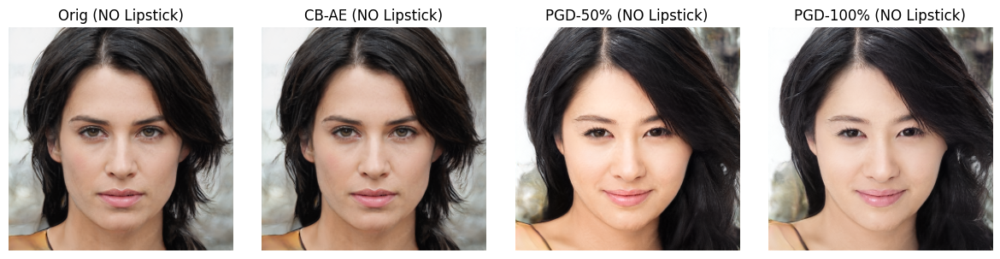


--- Sample 2 ---
Original: NO Lipstick 100.0%
CB-AE swap: NO Lipstick 100.0%
PGD-50%: Wearing Lipstick 100.0%
PGD-100%: Wearing Lipstick 99.9%


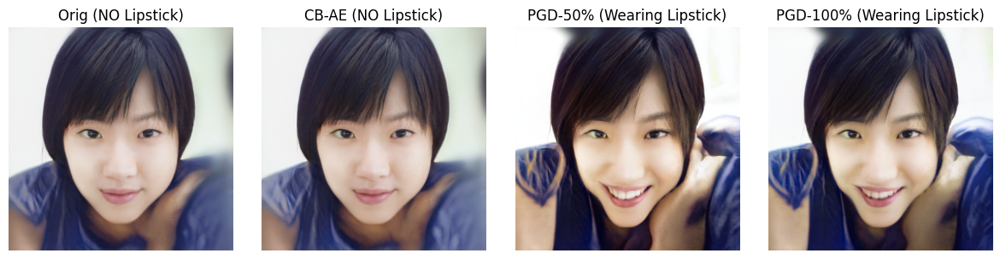


--- Sample 3 ---
Original: NO Lipstick 100.0%
CB-AE swap: NO Lipstick 100.0%
PGD-50%: NO Lipstick 99.8%
PGD-100%: NO Lipstick 100.0%


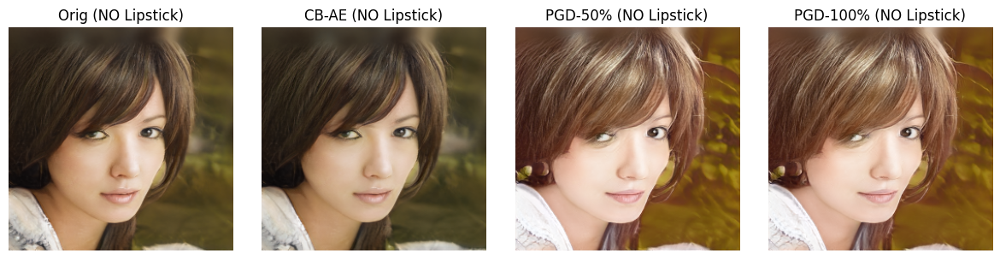

In [14]:
# %% code
import torch
import matplotlib.pyplot as plt
from torch.nn.functional import softmax, one_hot
from utils.utils import get_concept_index

# 1) Setup for “Wearing_Lipstick”
target_concept = 'Wearing_Lipstick'
concept_value  = 1   # 1 = Wearing Lipstick, 0 = No Lipstick
idx            = conc_clsf_classes.index(target_concept)
start, end     = get_concept_index(model, idx)
slice_size     = end - start  # should be 2

# Off/On labels pulled from your metadata
label_off = set_of_classes[idx][0]  # 'NO Lipstick'
label_on  = set_of_classes[idx][1]  # 'Wearing Lipstick'

# 2) Helper to get (label, confidence) from con_clsf
def classify_with_conf(img):
    x      = tf_conclsf(img.unsqueeze(0))       # normalize
    logits = con_clsf(x)[0]                      # [2]
    probs  = softmax(logits, dim=0)              # [2]
    pred   = probs.argmax().item()
    label  = set_of_classes[idx][pred]
    return label, probs[pred].item()

# 3) PGD parameters
full_steps = optint_iters
half_steps = full_steps // 2
eps        = optint_eps

for sample_i in range(1,4):
    print(f"\n--- Sample {sample_i} ---")
    # A) sample until exact “NO Lipstick” original
    for _ in range(50):
        z     = torch.randn((1, model.gen.z_dim), device=device)
        w     = model.gen.mapping(z, None, truncation_psi=1.0)
        img_o = model.gen.synthesis(
                    model.cbae.dec(model.cbae.enc(w)),
                    noise_mode='const'
                ).clamp(-1,1).mul(0.5).add_(0.5)[0]
        lbl_o, conf_o = classify_with_conf(img_o)
        if lbl_o == label_off and conf_o > 0.9:
            print("Original:", lbl_o, f"{conf_o:.1%}")
            break
    else:
        raise RuntimeError(f"No high‐conf {label_off} sample in 50 tries")

    # B) CB-AE bottleneck swap → Lipstick
    c_orig = model.cbae.enc(w)
    c_swap = c_orig.clone()
    c_swap[:, start:end] = 0
    c_swap[:, start:end] = one_hot(
        torch.tensor([concept_value], device=device),
        num_classes=slice_size
    ).float()
    img_bae = model.gen.synthesis(
                  model.cbae.dec(c_swap),
                  noise_mode='const'
              ).clamp(-1,1).mul(0.5).add_(0.5)[0]
    lbl_b, conf_b = classify_with_conf(img_bae)
    print("CB-AE swap:", lbl_b, f"{conf_b:.1%}")

    # C) PGD half-steps (intermediate)
    w_half = opt_int(model, w, idx, concept_value,
                     num_iters=half_steps, eps=eps, device=device)
    img_half = model.gen.synthesis(
                   w_half,
                   noise_mode='const'
               ).clamp(-1,1).mul(0.5).add_(0.5)[0]
    lbl_h, conf_h = classify_with_conf(img_half)
    print("PGD-50%:", lbl_h, f"{conf_h:.1%}")

    # D) PGD full-steps (final)
    w_full = opt_int(model, w, idx, concept_value,
                     num_iters=full_steps, eps=eps, device=device)
    img_full = model.gen.synthesis(
                   w_full,
                   noise_mode='const'
               ).clamp(-1,1).mul(0.5).add_(0.5)[0]
    lbl_f, conf_f = classify_with_conf(img_full)
    print("PGD-100%:", lbl_f, f"{conf_f:.1%}")

    # 4) Plot all four stages
    stages = [img_o, img_bae, img_half, img_full]
    titles = [
        f"Orig ({lbl_o})",
        f"CB-AE ({lbl_b})",
        f"PGD-50% ({lbl_h})",
        f"PGD-100% ({lbl_f})"
    ]
    fig, axes = plt.subplots(1,4,figsize=(12,3))
    for ax, im, t in zip(axes, stages, titles):
        ax.imshow(im.detach().cpu().permute(1,2,0).numpy())
        ax.set_title(t)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

## PGD Adversarial Attack on Synthesized Images

A PGD (Projected Gradient Descent) “attack” on your generated images would be an adversarial perturbation designed to fool your concept classifier into predicting the **wrong** label. Here’s how it works:

1. **What it is**
   An iterative pixel-space perturbation that maximizes the loss of your classifier on a given image, subject to an \(\ell_\infty\) constraint \(\|\delta\|_\infty \le \epsilon\).

2. **How it works**
   1. Start with a clean image \(x\) (e.g. your generated face).
   2. Initialize a small random perturbation \(\delta_0 \in [-\epsilon, \epsilon]^n\).
   3. For \(t = 1 \dots T\):
      - Compute the gradient of the loss w.r.t. the perturbed image:
        \[
          g_t \;=\; \nabla_{x'} \, \mathcal{L}\bigl(f(x'_t), y_{\text{true}}\bigr)
        \]
        where \(x'_t = \text{clip}(x + \delta_{t-1}, 0, 1)\).
      - Update via a step of size \(\alpha\):
        \[
          \delta_t = \text{Proj}_{\|\cdot\|_\infty \le \epsilon}\Bigl(\delta_{t-1} + \alpha\,\text{sign}(g_t)\Bigr)
        \]
      - Clip \(x'_t = \text{clip}(x + \delta_t, 0, 1)\).
   4. After \(T\) steps, \(x^* = x + \delta_T\) is your adversarial example.

3. **Pros & Cons**
   - **Pros:**
     - Finds minimal pixel changes that reliably flip your classifier’s decision.
     - A standard way to test your classifier’s robustness.
   - **Cons:**
     - Introduces visible noise if \(\epsilon\) is large.
     - Only attacks the classifier, not the generator itself.

---

### Example PyTorch snippet

```python
import torch
from torch.nn.functional import cross_entropy

def pgd_image_attack(model_clsf, x, y_true, eps=0.03, alpha=0.007, steps=40):
    """
    model_clsf: your concept classifier
    x: [1,C,H,W] input image in [0,1]
    y_true: correct label tensor [1]
    Returns: adversarial image x_adv
    """
    x_adv = x.clone().detach().requires_grad_(True)
    for _ in range(steps):
        logits = model_clsf(tf_conclsf(x_adv))
        loss = cross_entropy(logits, y_true)
        loss.backward()
        # gradient sign step
        grad_sign = x_adv.grad.data.sign()
        x_adv.data = torch.clamp(x_adv.data + alpha * grad_sign, x - eps, x + eps)
        x_adv.data = torch.clamp(x_adv.data, 0, 1)
        x_adv.grad.data.zero_()
    return x_adv.detach()

# Usage:
# 1) Generate an image x and its true label y_true = classifier(x).argmax()
# 2) Call x_adv = pgd_image_attack(con_clsf, x.unsqueeze(0), y_true, eps=0.03)
# 3) Visualize x vs. x_adv to see the adversarial noise


### Adversarial PGD Attack on Generated Image

This section demonstrates a Projected Gradient Descent (PGD) adversarial attack applied directly to an image synthesized by the generative model. The purpose is to assess the vulnerability of the concept classifier (in this case, "Male/Female") to adversarial perturbations in pixel space.

**Procedure:**
1. **Generate a sample face:** A synthetic face is generated from a random latent code using the pretrained generator.
2. **Obtain the ground-truth classifier prediction:** The image is passed through the concept classifier to determine its initial predicted gender and associated confidence.
3. **Apply PGD attack:** An iterative procedure perturbs the input image within an $\ell_\infty$ ball of radius $\epsilon$, maximizing the loss for the classifier. The goal is to flip the classifier's prediction to the opposite gender while keeping the perturbation visually imperceptible.
4. **Evaluate and visualize:** The adversarial image is re-classified to confirm label change. Original and adversarial images are shown side by side, with their predicted labels and classifier confidences.

**Parameters to Note:**
- `eps` $(\epsilon)$: Maximum allowed perturbation (attack strength).
- `alpha`: Step size for each iteration.
- `steps`: Number of attack iterations.

This attack illustrates the susceptibility of neural network classifiers to small, adversarial changes in the input and provides a visual understanding of robustness (or lack thereof) in the deployed model.

Original prediction: Male (99.9%)
Adversarial prediction: Female (100.0%)


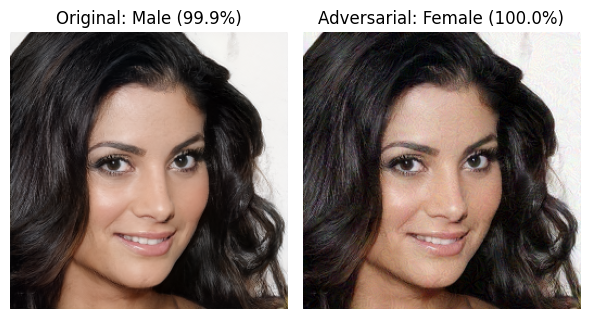

In [15]:
# %% code
import torch
import matplotlib.pyplot as plt
from torch.nn.functional import cross_entropy, softmax

def pgd_image_attack(model_clsf, img, y_true, eps=0.03, alpha=0.005, steps=20):
    """
    model_clsf: classifier (expects normalized input)
    img:       [1,C,H,W] tensor in [0,1]
    y_true:    scalar tensor with the correct label (0 or 1)
    """
    x_adv = img.clone().detach().requires_grad_(True)
    for _ in range(steps):
        logits = model_clsf(tf_conclsf(x_adv))
        loss = cross_entropy(logits, y_true)
        loss.backward()
        # step in sign direction
        x_adv.data = x_adv.data + alpha * x_adv.grad.data.sign()
        # project back into eps-ball around original
        x_adv.data = torch.max(torch.min(x_adv.data, img + eps), img - eps)
        # clamp valid pixel range
        x_adv.data = x_adv.data.clamp(0, 1)
        x_adv.grad.data.zero_()
    return x_adv.detach()

# 1) Sample & synthesize
z = torch.randn((1, model.gen.z_dim), device=device)
w = model.gen.mapping(z, None, truncation_psi=1.0)
img = model.gen.synthesis(w, noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)  # [-1,1]->[0,1]
img = img  # [1,3,H,W]

# 2) Get “true” label & confidence
with torch.no_grad():
    logits = con_clsf(tf_conclsf(img))
    probs = softmax(logits, dim=1)[0]
    true_label = probs.argmax().unsqueeze(0)  # tensor([0]) or tensor([1])
    true_conf = probs[true_label].item()
    true_name = set_of_classes[conc_clsf_classes.index('Male')][true_label]

print(f"Original prediction: {true_name} ({true_conf:.1%})")

# 3) Attack
img_adv = pgd_image_attack(con_clsf, img, true_label, eps=0.03, alpha=0.005, steps=20)

# 4) Classify adversarial
with torch.no_grad():
    logits2 = con_clsf(tf_conclsf(img_adv))
    probs2 = softmax(logits2, dim=1)[0]
    adv_label = probs2.argmax().item()
    adv_conf  = probs2[adv_label].item()
    adv_name  = set_of_classes[conc_clsf_classes.index('Male')][adv_label]

print(f"Adversarial prediction: {adv_name} ({adv_conf:.1%})")

# 5) Show side by side
fig, axes = plt.subplots(1, 2, figsize=(6,6))
for ax, im, title in zip(axes,
                         [img[0], img_adv[0]],
                         [f"Original: {true_name} ({true_conf:.1%})",
                          f"Adversarial: {adv_name} ({adv_conf:.1%})"]):
    ax.imshow(im.permute(1,2,0).cpu().numpy())
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

### Continuous Concept Interpolation & Robustness Evaluation

As a secondary extension, we’ll smoothly interpolate a target concept (e.g. “Smiling”) from off→on and evaluate under clean and adversarial conditions.

#### 1. Smooth Interpolation

```python
# %% code
import torch
import numpy as np
import matplotlib.pyplot as plt
from utils.utils import get_concept_index

# Settings
target_concept = 'Smiling'
idx            = conc_clsf_classes.index(target_concept)
start, end     = get_concept_index(model, idx)
n_steps        = 10   # number of interpolation points

# 1) Sample one latent and encode
z   = torch.randn((1, model.gen.z_dim), device=device)
w   = model.gen.mapping(z, None, truncation_psi=1.0)
c0  = model.cbae.enc(w)            # original concept vector
c1  = c0.clone()
c1[:, start:end] = one_hot(torch.tensor([1], device=device), num_classes=(end-start)).float()

# 2) Generate interpolated images
imgs = []
for α in np.linspace(0,1,n_steps):
    cα = c0 * (1-α) + c1 * α
    wα = model.cbae.dec(cα)
    img = model.gen.synthesis(wα, noise_mode='const').clamp(-1,1).mul(0.5).add_(0.5)
    imgs.append(img[0].cpu().permute(1,2,0).numpy())

# 3) Plot grid
fig, axes = plt.subplots(1, n_steps, figsize=(2*n_steps,2))
for ax, im, α in zip(axes, imgs, np.linspace(0,1,n_steps)):
    ax.imshow(im)
    ax.set_title(f"{α:.1f}")
    ax.axis('off')
plt.suptitle("Smiling Interpolation (0→1)")
plt.tight_layout()
plt.show()


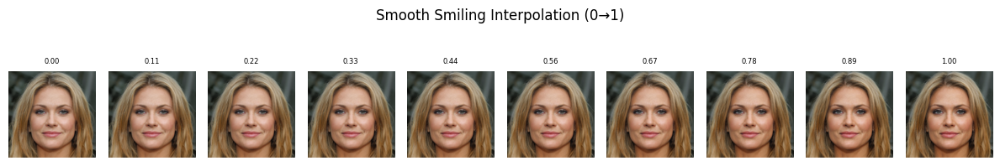

In [16]:
# %% code
import torch
import numpy as np
import matplotlib.pyplot as plt
from utils.utils import get_concept_index

# 1) Settings
target_concept = 'Smiling'
n_steps        = 10
idx            = conc_clsf_classes.index(target_concept)
start, end     = get_concept_index(model, idx)

# 2) Sample one latent and get concept endpoints
z   = torch.randn((1, model.gen.z_dim), device=device)
w   = model.gen.mapping(z, None, truncation_psi=1.0)
c0  = model.cbae.enc(w)           # original (no smile)
c1  = c0.clone()
c1[:, start:end] = 0
c1[:, start + 1] = 1.0            # set “Smiling” = on

# 3) Generate interpolated images
imgs = []
alphas = np.linspace(0, 1, n_steps)
for α in alphas:
    cα = c0 * (1 - α) + c1 * α
    wα = model.cbae.dec(cα)
    img = model.gen.synthesis(wα, noise_mode='const')
    img = img.clamp(-1,1).mul(0.5).add_(0.5)  # to [0,1]
    # detach before numpy
    np_img = img[0].detach().cpu().permute(1,2,0).numpy()
    imgs.append(np_img)

# 4) Plot
fig, axes = plt.subplots(1, n_steps, figsize=(n_steps*1.2, 2))
for ax, im, α in zip(axes, imgs, alphas):
    ax.imshow(im)
    ax.set_title(f"{α:.2f}", fontsize=6)
    ax.axis('off')
plt.suptitle("Smooth Smiling Interpolation (0→1)", y=1.05)
plt.tight_layout()
plt.show()

### Concept Interpolation in Latent Attribute Space

This section demonstrates how to perform linear interpolation of a binary concept (e.g., "Smiling", "Attractive") within the bottleneck concept space of the Concept Bottleneck Autoencoder (CB-AE). The goal is to visualize the effect of gradually activating a single attribute while holding all other attributes fixed.

**Procedure:**
1. Sample a random latent vector.
2. Encode this latent into the CB-AE concept space.
3. Identify the slice corresponding to the target attribute.
4. Construct two endpoint concept vectors: one with the target attribute off (0), and one with it on (1).
5. Generate a sequence of interpolated concept vectors between these endpoints.
6. For each interpolated vector, decode to the GAN latent space and synthesize the corresponding image.
7. Visualize the image sequence to analyze attribute-specific changes.

**Parameters:**
- `target_concept`: Name of the concept/attribute to interpolate.
- `n_steps`: Number of interpolation steps.
- `figsize`, `suptitle`, `fontsize`: Plot formatting options.

This methodology allows systematic evaluation of the model’s disentanglement and attribute controllability. Users are encouraged to repeat the procedure for various attributes to assess robustness and to inspect any secondary attribute changes during interpolation.

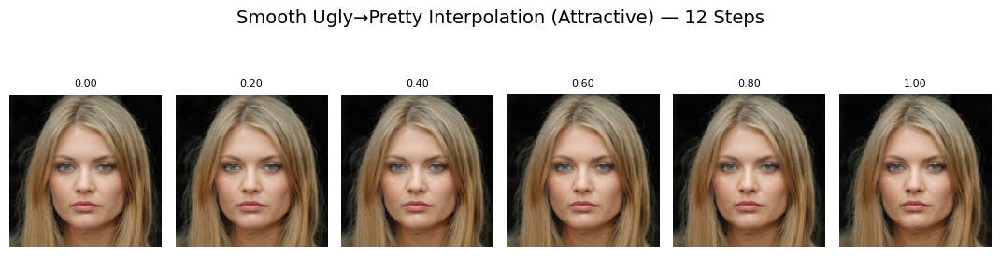

In [61]:
# %% code
import torch
import numpy as np
import matplotlib.pyplot as plt
from utils.utils import get_concept_index

# 1) Settings
target_concept = 'Attractive'
n_steps        = 6
idx            = conc_clsf_classes.index(target_concept)
start, end     = get_concept_index(model, idx)

# 2) Sample one latent and get concept endpoints
z   = torch.randn((1, model.gen.z_dim), device=device)
w   = model.gen.mapping(z, None, truncation_psi=1.0)
c0  = model.cbae.enc(w)           # original (Not Attractive)
c1  = c0.clone()
c1[:, start:end] = 0
c1[:, start + 1] = 1.0            # set “Attractive” = on

# 3) Generate interpolated images
imgs = []
alphas = np.linspace(0, 1, n_steps)
for α in alphas:
    cα = c0 * (1 - α) + c1 * α
    wα = model.cbae.dec(cα)
    img = model.gen.synthesis(wα, noise_mode='const')
    img = img.clamp(-1,1).mul(0.5).add_(0.5)  # to [0,1]
    np_img = img[0].detach().cpu().permute(1,2,0).numpy()
    imgs.append(np_img)

# 4) Plot with larger figure size
fig, axes = plt.subplots(1, n_steps, figsize=(n_steps*1.8, 3))
for ax, im, α in zip(axes, imgs, alphas):
    ax.imshow(im)
    ax.set_title(f"{α:.2f}", fontsize=8)
    ax.axis('off')
plt.suptitle("Smooth Ugly→Pretty Interpolation (Attractive) — 12 Steps", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()